In [1]:
!pip install --upgrade ultralytics --no-deps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 19.1 MB/s eta 0:00:00


In [2]:
import json, shutil, random
from pathlib import Path
from ultralytics import YOLO
from tqdm.auto import tqdm
import yaml

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


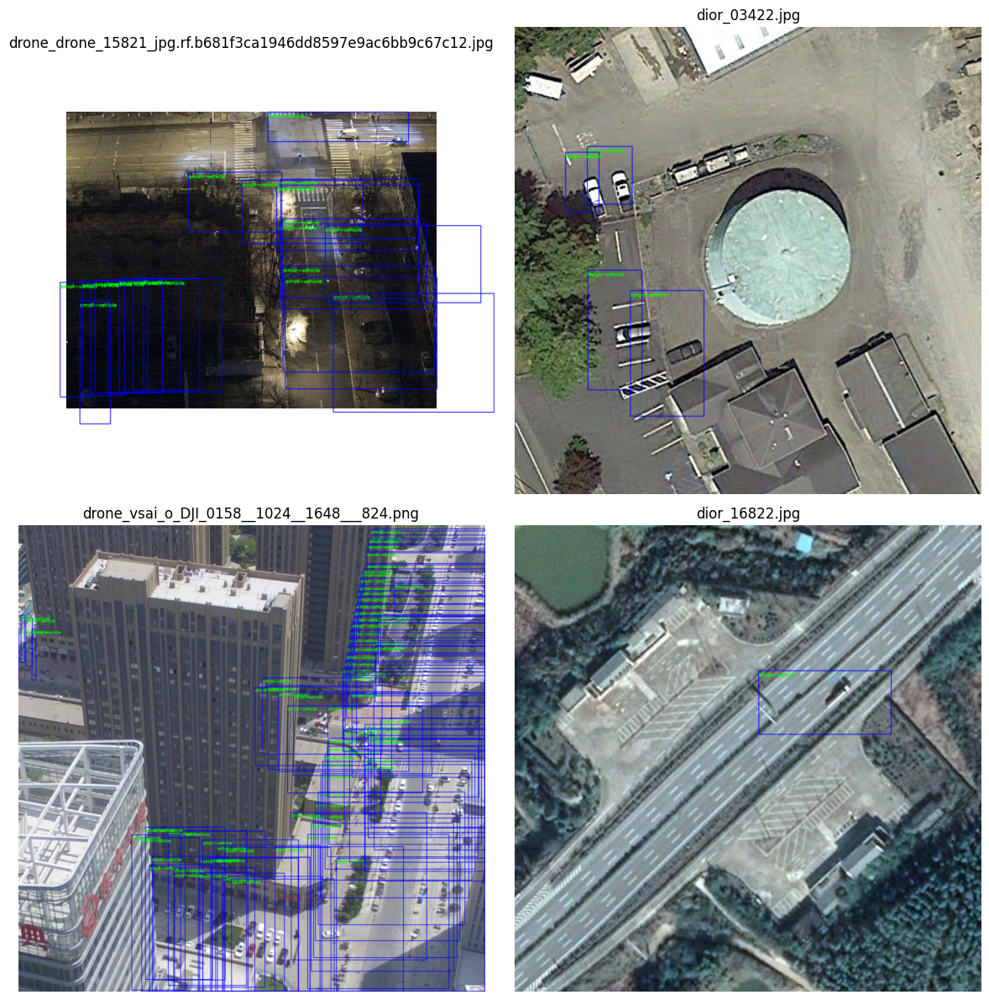

In [3]:
import os
import random
import yaml
import cv2
import matplotlib.pyplot as plt

# Paths
dataset_path = "/kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset"
train_img_path = os.path.join(dataset_path, "train/images")
train_label_path = os.path.join(dataset_path, "train/labels")
yaml_file = os.path.join(dataset_path, "data.yaml")

# Load class names from YAML
with open(yaml_file, "r") as f:
    data = yaml.safe_load(f)
names = data["names"]

# Pick random images
image_files = os.listdir(train_img_path)
random_imgs = random.sample(image_files, 4)

# Plotting setup
fig, ax = plt.subplots(2, 2, figsize=(12, 12))
ax = ax.flatten()

for i, img_name in enumerate(random_imgs):
    img_path = os.path.join(train_img_path, img_name)
    label_path = os.path.join(train_label_path, img_name.replace(".jpg", ".txt").replace(".png", ".txt"))

    # Load image
    img = cv2.imread(img_path)
    h, w, _ = img.shape

    # Load labels if exists
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            labels = [line.strip().split() for line in f.readlines()]

        for label in labels:
            cls, x, y, bw, bh = map(float, label[:5])
            cls = int(cls)

            # ✅ Shrink bounding box for very tight fit
            shrink_factor = 0.4  # 40% of original box size
            bw *= shrink_factor
            bh *= shrink_factor

            # Convert YOLO normalized coordinates to pixel coordinates
            x1 = int(max((x - bw / 2) * w, 0))
            y1 = int(max((y - bh / 2) * h, 0))
            x2 = int(min((x + bw / 2) * w, w - 1))
            y2 = int(min((y + bh / 2) * h, h - 1))

            # Draw smaller rectangle with anti-aliasing for smooth lines
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 1, lineType=cv2.LINE_AA)

            # Draw smaller text inside box if possible
            text_size = 0.3
            text_thickness = 1
            text_y = y1 + 10 if y1 + 10 < h else y1 - 5
            cv2.putText(img, names[cls], (x1, text_y),
                        cv2.FONT_HERSHEY_SIMPLEX, text_size, (0, 255, 0), text_thickness, cv2.LINE_AA)

    # Show image
    ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[i].set_title(img_name)
    ax[i].axis("off")

plt.tight_layout()
plt.show()

In [4]:
import os

# Base dataset path (update according to what the print above shows)
base_path = "/kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset"

yaml_content = f"""
# YOLO Dataset Configuration File

train: {base_path}/train/images
val: {base_path}/val/images
test: {base_path}/test/images

nc: 2
names: ['small-vehicle', 'large-vehicle']
"""

yaml_path = "/kaggle/working/data_vehicle.yaml"

with open(yaml_path, "w") as f:
    f.write(yaml_content.strip())

print("✅ data.yaml updated and saved successfully.")

✅ data.yaml updated and saved successfully.


In [5]:
import os

for root, dirs, files in os.walk("/kaggle", topdown=True):
    if "images" in dirs:
        print(os.path.join(root, "images"))

/kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/val/images
/kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images
/kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/train/images


In [6]:
teacher = YOLO("yolov10s.pt")  # pretrained
teacher_model = teacher.train(
    data   = "/kaggle/working/data_vehicle.yaml",
    epochs = 20,
    imgsz  = 640,
    batch  = 8,
    project= "/kaggle/working/",
    name   = "teacher",
    device = 0
)
teacher_weights = "/kaggle/working/teacher/weights/best.pt"

Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_vehicle.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=teacher, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, po

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       5420      81053      0.838      0.774      0.843      0.563
         small-vehicle       4592      71035      0.906       0.88      0.939      0.638
         large-vehicle       2394      10018       0.77      0.669      0.747      0.488
Speed: 0.2ms preprocess, 4.2ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /kaggle/working/teacher


In [7]:
import os
from ultralytics import YOLO

# Load teacher model
teacher = YOLO("/kaggle/working/teacher/weights/best.pt")

img_dir = "/kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/train/images"
all_imgs = sorted([os.path.join(img_dir, x) for x in os.listdir(img_dir) if x.endswith((".jpg",".png",".jpeg"))])

batch_size = 200
save_root = "/kaggle/working/raw"

print(f"Total images: {len(all_imgs)}")

for i in range(0, len(all_imgs), batch_size):
    batch = all_imgs[i : i + batch_size]
    print(f"Processing {i} → {i+len(batch)}")

    teacher.predict(
        source=batch,
        save_txt=True,
        save_conf=True,
        conf=0.7,
        project=save_root,
        name="",
        device=0
    )


Total images: 18274
Processing 0 → 200

0: 640x640 (no detections), 9.8ms
1: 640x640 1 large-vehicle, 9.8ms
2: 640x640 1 large-vehicle, 9.8ms
3: 640x640 (no detections), 9.8ms
4: 640x640 6 large-vehicles, 9.8ms
5: 640x640 (no detections), 9.8ms
6: 640x640 (no detections), 9.8ms
7: 640x640 3 large-vehicles, 9.8ms
8: 640x640 (no detections), 9.8ms
9: 640x640 (no detections), 9.8ms
10: 640x640 3 large-vehicles, 9.8ms
11: 640x640 (no detections), 9.8ms
12: 640x640 (no detections), 9.8ms
13: 640x640 2 large-vehicles, 9.8ms
14: 640x640 (no detections), 9.8ms
15: 640x640 2 large-vehicles, 9.8ms
16: 640x640 1 large-vehicle, 9.8ms
17: 640x640 4 large-vehicles, 9.8ms
18: 640x640 (no detections), 9.8ms
19: 640x640 5 large-vehicles, 9.8ms
20: 640x640 2 large-vehicles, 9.8ms
21: 640x640 (no detections), 9.8ms
22: 640x640 (no detections), 9.8ms
23: 640x640 (no detections), 9.8ms
24: 640x640 1 large-vehicle, 9.8ms
25: 640x640 1 large-vehicle, 9.8ms
26: 640x640 7 large-vehicles, 9.8ms
27: 640x640 (no 

In [8]:
from ultralytics import YOLO
student = YOLO("yolov10s.pt")
_ = student.train(
    data   = "/kaggle/working/data_vehicle.yaml",
    epochs = 20,
    imgsz  = 640,
    batch  = 8,
    project= "/kaggle/working/",
    name   = "student",
    device = 0
)

# 9. Evaluate student on test split ----------------------------------------
metrics = student.val(
    data   = "/kaggle/working/data_vehicle.yaml",
    imgsz  = 640,
    batch  = 8,
    device = 0
)
print(metrics)

Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_vehicle.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=student, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, po

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       5420      81053      0.838      0.774      0.843      0.563
         small-vehicle       4592      71035      0.906       0.88      0.939      0.638
         large-vehicle       2394      10018       0.77      0.669      0.747      0.488
Speed: 0.2ms preprocess, 4.2ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /kaggle/working/student
Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10s summary (fused): 106 layers, 7,218,774 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 321.4±502.3 MB/s, size: 418.6 KB)
val: Scanning /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/val/labels... 5420 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 5420/5420 438.8it/s 12.4s
WARNING ⚠️ val: Cache directory /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/val is not writable, cache not saved.
                 Class     Images  Instances      Box(

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       5420      81053      0.838      0.774      0.843      0.563
         small-vehicle       4592      71035      0.906       0.88      0.939      0.638
         large-vehicle       2394      10018      0.771      0.668      0.747      0.488
Speed: 0.8ms preprocess, 8.9ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /kaggle/working/runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b9d8d63dfd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/drone_vsai_u_DJI_0073__1024__0___824.png: 640x640 121 small-vehicles, 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


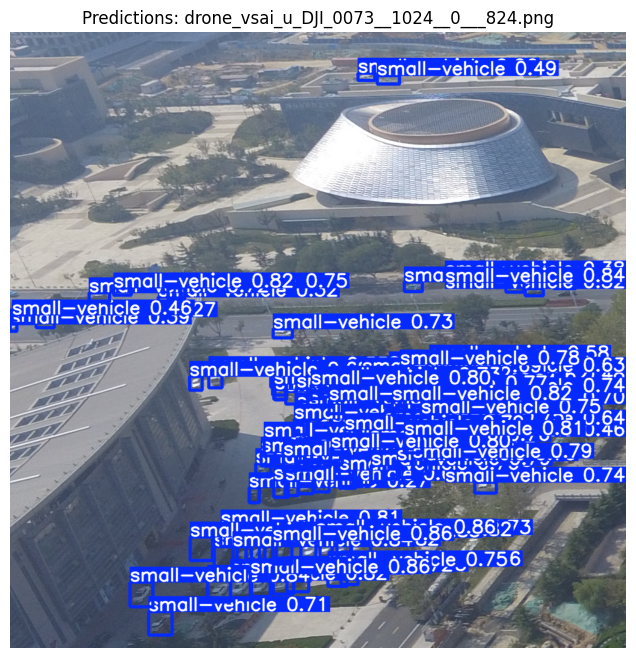


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/drone_vsai_f2_DJI_0432__1024__1648___1976.png: 640x640 9 small-vehicles, 14.8ms
Speed: 3.1ms preprocess, 14.8ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


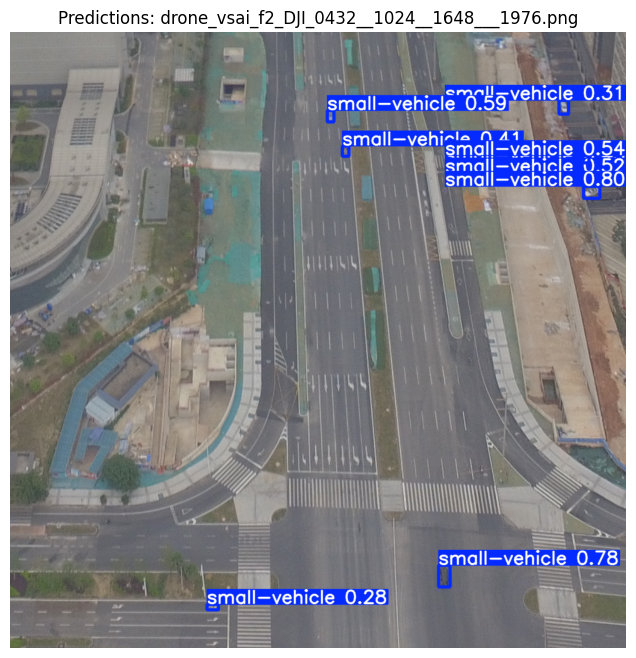


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/drone_drone_03363_jpg.rf.28516997c2255740ebe130754b740fee.jpg: 544x640 17 small-vehicles, 51.8ms
Speed: 2.6ms preprocess, 51.8ms inference, 0.5ms postprocess per image at shape (1, 3, 544, 640)


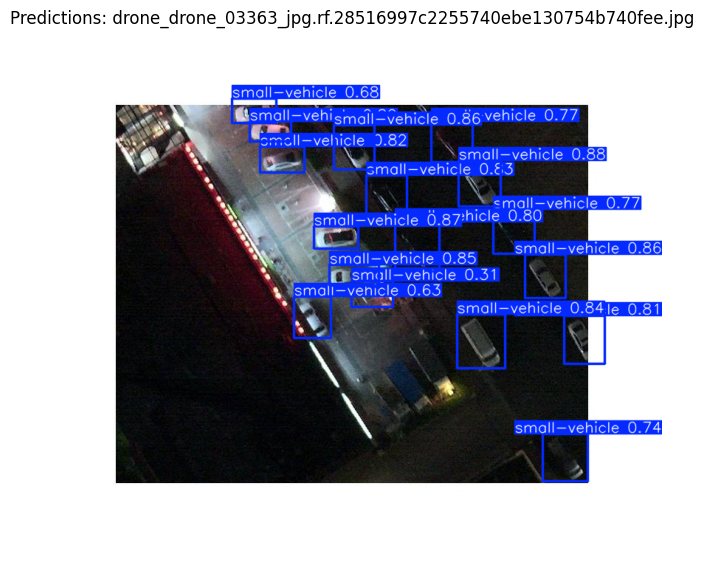


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/drone_drone_16266_jpg.rf.55119fc9855eed00a0af333546481c34.jpg: 544x640 14 small-vehicles, 14.0ms
Speed: 2.8ms preprocess, 14.0ms inference, 0.4ms postprocess per image at shape (1, 3, 544, 640)


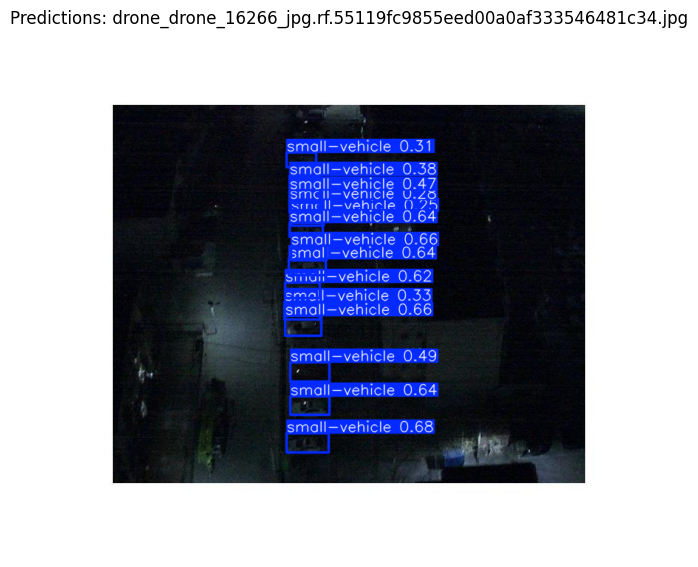


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/dior_22709.jpg: 640x640 8 large-vehicles, 15.6ms
Speed: 2.8ms preprocess, 15.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


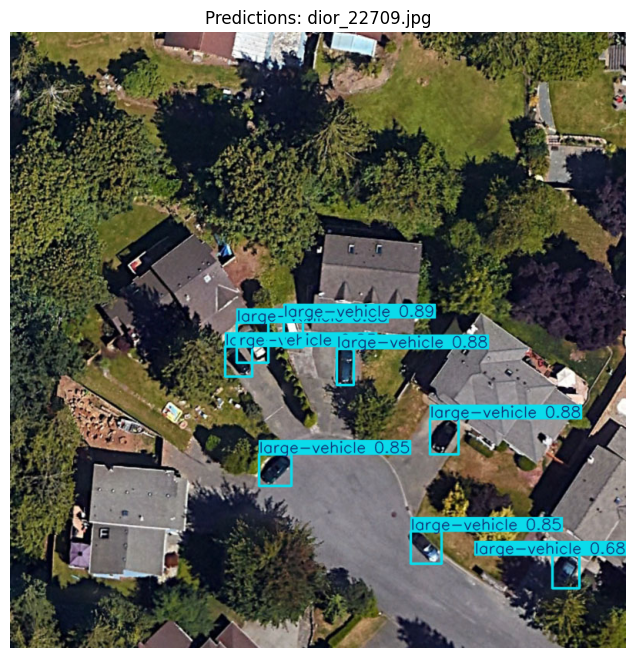

In [9]:
import os
import random
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2

# Load your trained YOLOv12 model
model = YOLO("/kaggle/working/teacher/weights/best.pt")

# ✅ Path to test images
test_images_dir = "/kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images"

# Randomly pick 5 images
image_paths = os.listdir(test_images_dir)
random_images = random.sample(image_paths, 5)

# Show predictions
for img_name in random_images:
    img_path = os.path.join(test_images_dir, img_name)
    results = model.predict(img_path, conf=0.25)

    # Visualize predictions
    res_plotted = results[0].plot()  # plotted NumPy image (BGR)
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
    plt.title(f"Predictions: {img_name}")
    plt.axis("off")
    plt.show()

In [10]:
from ultralytics import YOLO
import numpy as np

# Load best trained model
model = YOLO("/kaggle/working/teacher/weights/best.pt")

# Evaluate the model on the validation set
metrics = model.val()

# Helper function to safely extract scalar values
def get_scalar(value):
    if isinstance(value, (np.ndarray, list)):
        return float(np.mean(value))  # take average if array
    return float(value)

# Extract metrics
map50 = get_scalar(metrics.box.map50)
map5095 = get_scalar(metrics.box.map)
precision = get_scalar(metrics.box.p)
recall = get_scalar(metrics.box.r)
f1 = get_scalar(metrics.box.f1)

# Print results
print("\n📊 Model Evaluation Results:")
print(f"Model Name       : {model.model.name if hasattr(model.model, 'name') else 'YOLOv10 Vehicle Model'}")
print(f"mAP@0.5          : {map50:.4f}")
print(f"mAP@0.5:0.95     : {map5095:.4f}")
print(f"Precision        : {precision:.4f}")
print(f"Recall           : {recall:.4f}")
print(f"F1-Score         : {f1:.4f}")

Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10s summary (fused): 106 layers, 7,218,774 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 521.1±727.5 MB/s, size: 412.6 KB)
val: Scanning /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/val/labels... 5420 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 5420/5420 495.1it/s 10.9s
WARNING ⚠️ val: Cache directory /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/val is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 339/339 4.4it/s 1:16


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       5420      81053      0.838      0.774      0.843      0.563
         small-vehicle       4592      71035      0.906       0.88      0.939      0.638
         large-vehicle       2394      10018      0.771      0.668      0.747      0.488
Speed: 0.8ms preprocess, 9.4ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /kaggle/working/runs/detect/val2

📊 Model Evaluation Results:
Model Name       : YOLOv10 Vehicle Model
mAP@0.5          : 0.8429
mAP@0.5:0.95     : 0.5632
Precision        : 0.8382
Recall           : 0.7737
F1-Score         : 0.8040


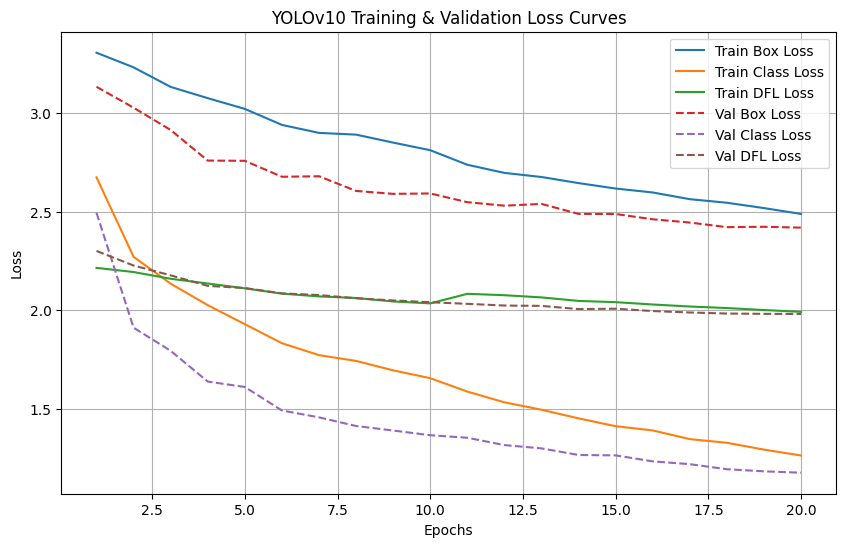

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to results CSV file generated automatically
csv_path = "/kaggle/working/teacher/results.csv"

# Read CSV data
df = pd.read_csv(csv_path)

# Plot losses
plt.figure(figsize=(10,6))
plt.plot(df["epoch"], df["train/box_loss"], label="Train Box Loss")
plt.plot(df["epoch"], df["train/cls_loss"], label="Train Class Loss")
plt.plot(df["epoch"], df["train/dfl_loss"], label="Train DFL Loss")
plt.plot(df["epoch"], df["val/box_loss"], '--', label="Val Box Loss")
plt.plot(df["epoch"], df["val/cls_loss"], '--', label="Val Class Loss")
plt.plot(df["epoch"], df["val/dfl_loss"], '--', label="Val DFL Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("YOLOv10 Training & Validation Loss Curves")
plt.legend()
plt.grid(True)
plt.show()


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/dior_05453.jpg: 640x640 4 large-vehicles, 14.7ms
Speed: 2.8ms preprocess, 14.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


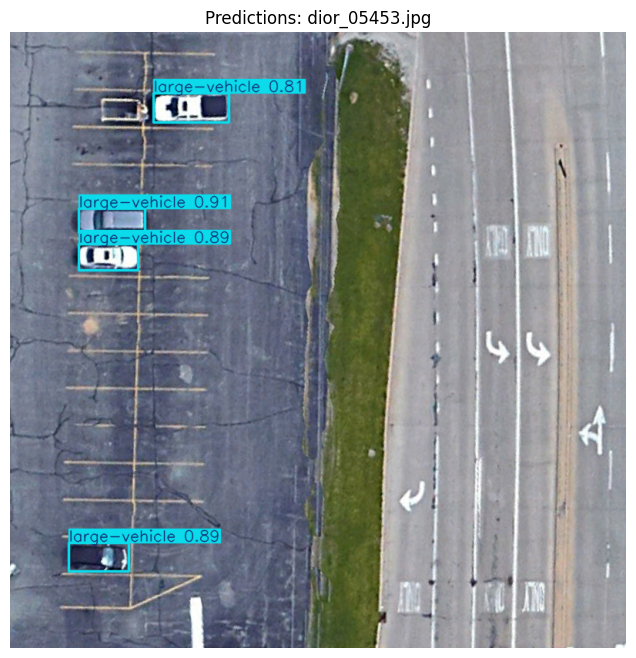


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/drone_vsai_f1_DJI_0869__1024__2472___1976.png: 640x640 1 small-vehicle, 14.8ms
Speed: 3.2ms preprocess, 14.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


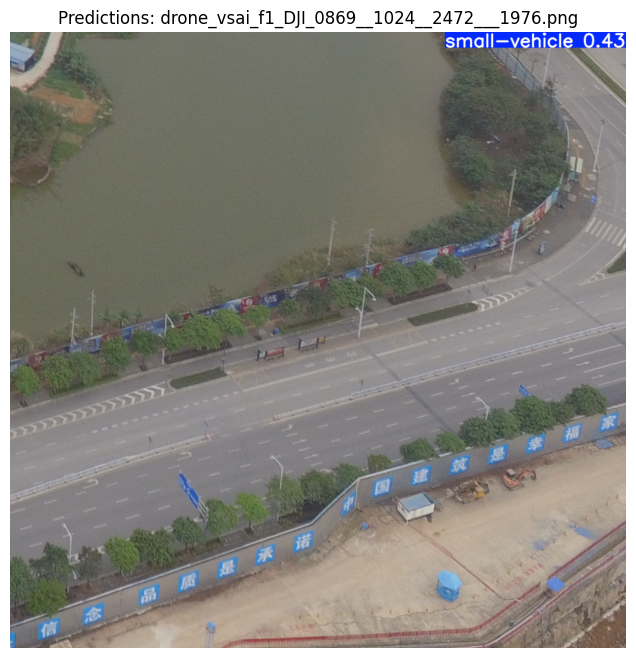


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/drone_drone_04468_jpg.rf.df0407925b08bf62e992d45b70275589.jpg: 544x640 16 small-vehicles, 14.7ms
Speed: 2.7ms preprocess, 14.7ms inference, 0.5ms postprocess per image at shape (1, 3, 544, 640)


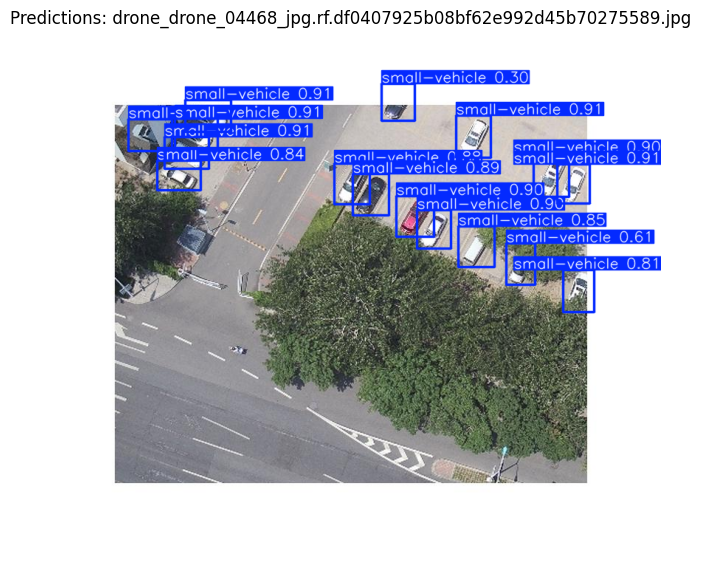


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/drone_drone_05319_jpg.rf.f290bbcd76422c8f033bae8ffd944fb9.jpg: 544x640 15 small-vehicles, 13.9ms
Speed: 2.5ms preprocess, 13.9ms inference, 0.4ms postprocess per image at shape (1, 3, 544, 640)


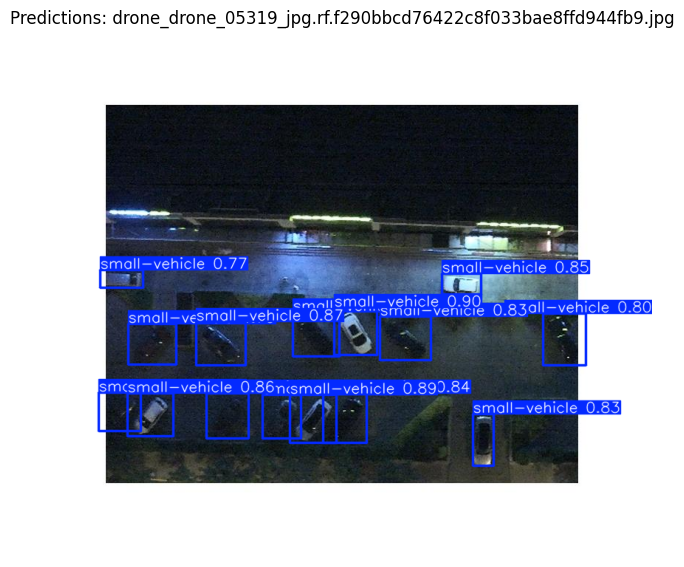


image 1/1 /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images/drone_vsai_r4_DJI_0754__1024__1648___0.png: 640x640 1 small-vehicle, 15.4ms
Speed: 3.0ms preprocess, 15.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)


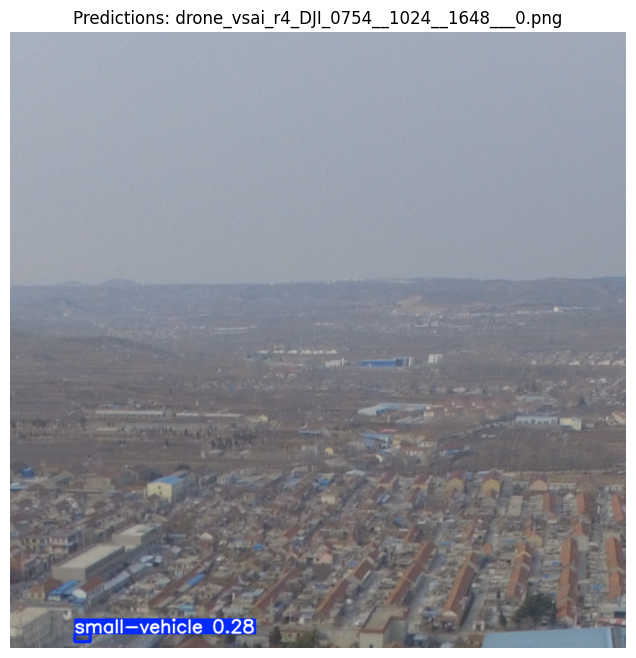

In [12]:
import os
import random
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2

# Load your trained YOLOv12 model
model = YOLO("/kaggle/working/student/weights/best.pt")

# ✅ Path to test images
test_images_dir = "/kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/test/images"

# Randomly pick 5 images
image_paths = os.listdir(test_images_dir)
random_images = random.sample(image_paths, 5)

# Show predictions
for img_name in random_images:
    img_path = os.path.join(test_images_dir, img_name)
    results = model.predict(img_path, conf=0.25)

    # Visualize predictions
    res_plotted = results[0].plot()  # plotted NumPy image (BGR)
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
    plt.title(f"Predictions: {img_name}")
    plt.axis("off")
    plt.show()

In [13]:
from ultralytics import YOLO
import numpy as np

# Load best trained model
model = YOLO("/kaggle/working/student/weights/best.pt")

# Evaluate the model on the validation set
metrics = model.val()

# Helper function to safely extract scalar values
def get_scalar(value):
    if isinstance(value, (np.ndarray, list)):
        return float(np.mean(value))  # take average if array
    return float(value)

# Extract metrics
map50 = get_scalar(metrics.box.map50)
map5095 = get_scalar(metrics.box.map)
precision = get_scalar(metrics.box.p)
recall = get_scalar(metrics.box.r)
f1 = get_scalar(metrics.box.f1)

# Print results
print("\n📊 Model Evaluation Results:")
print(f"Model Name       : {model.model.name if hasattr(model.model, 'name') else 'YOLOv10 Vehicle Model'}")
print(f"mAP@0.5          : {map50:.4f}")
print(f"mAP@0.5:0.95     : {map5095:.4f}")
print(f"Precision        : {precision:.4f}")
print(f"Recall           : {recall:.4f}")
print(f"F1-Score         : {f1:.4f}")

Ultralytics 8.3.237 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10s summary (fused): 106 layers, 7,218,774 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 665.9±771.3 MB/s, size: 608.9 KB)
val: Scanning /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/val/labels... 5420 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 5420/5420 490.0it/s 11.1s
WARNING ⚠️ val: Cache directory /kaggle/input/aerial-vehicle-obb-dataset/RoadVehiclesYOLOOBBDataset/val is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 339/339 4.4it/s 1:16


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       5420      81053      0.838      0.774      0.843      0.563
         small-vehicle       4592      71035      0.906       0.88      0.939      0.638
         large-vehicle       2394      10018      0.771      0.668      0.747      0.488
Speed: 0.8ms preprocess, 9.3ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /kaggle/working/runs/detect/val3

📊 Model Evaluation Results:
Model Name       : YOLOv10 Vehicle Model
mAP@0.5          : 0.8429
mAP@0.5:0.95     : 0.5632
Precision        : 0.8382
Recall           : 0.7737
F1-Score         : 0.8040


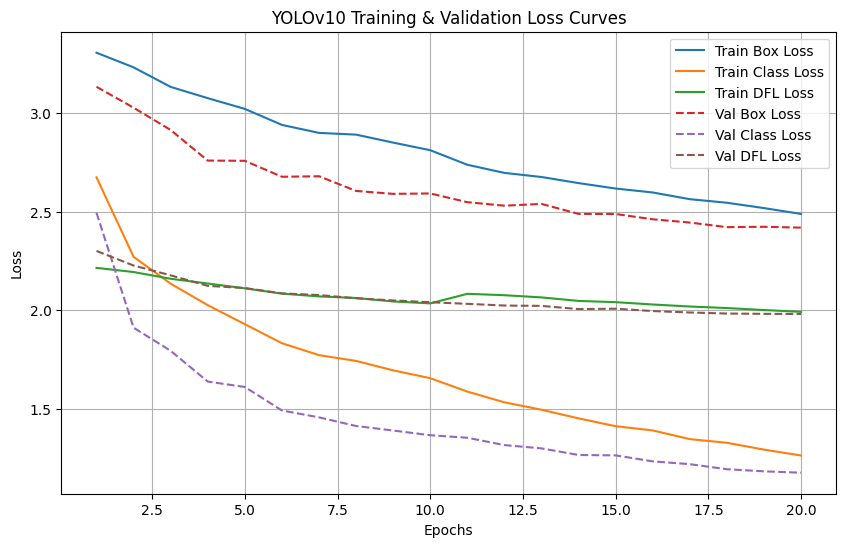

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to results CSV file generated automatically
csv_path = "/kaggle/working/student/results.csv"

# Read CSV data
df = pd.read_csv(csv_path)

# Plot losses
plt.figure(figsize=(10,6))
plt.plot(df["epoch"], df["train/box_loss"], label="Train Box Loss")
plt.plot(df["epoch"], df["train/cls_loss"], label="Train Class Loss")
plt.plot(df["epoch"], df["train/dfl_loss"], label="Train DFL Loss")
plt.plot(df["epoch"], df["val/box_loss"], '--', label="Val Box Loss")
plt.plot(df["epoch"], df["val/cls_loss"], '--', label="Val Class Loss")
plt.plot(df["epoch"], df["val/dfl_loss"], '--', label="Val DFL Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("YOLOv10 Training & Validation Loss Curves")
plt.legend()
plt.grid(True)
plt.show()